In [1]:
import matplotlib.pyplot as plt
from sklearn.manifold import MDS
import pandas as pd
import zipfile
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.decomposition import PCA
import networkx as nx
from sklearn.preprocessing import StandardScaler
import numpy as np
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models
import math
from tensorflow.keras.models import load_model
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Data preparation

## Load and train/test split

In [2]:
with zipfile.ZipFile('superconductivty+data.zip', 'r') as z:    
    with z.open('train.csv') as f:
        df = pd.read_csv(f)

target_column = 'critical_temp'
X = df.drop(columns=[target_column])
y = df[target_column]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1337
)

X_train

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
10403,2,71.082750,64.369000,68.169549,61.861084,0.652449,0.691623,40.28250,3.553000,20.141250,...,4.500000,4.666667,4.472136,4.641589,0.686962,0.598270,1,2.000000,0.500000,0.471405
4292,5,69.171250,49.067610,54.872765,34.230190,1.419173,1.322714,121.32760,17.127567,41.809011,...,2.200000,2.066667,2.168944,2.054799,1.594167,1.206764,1,1.053333,0.400000,0.249444
20914,6,55.940606,67.060571,41.977919,50.661140,1.525782,1.291521,122.90607,34.488887,42.479064,...,3.166667,3.237500,2.768229,3.053499,1.677473,1.607927,4,0.737500,1.462494,1.109547
1678,5,103.006010,56.062921,79.085090,36.394169,1.435319,1.464096,141.25060,17.333563,54.192468,...,2.600000,2.103846,2.491462,2.079406,1.564957,1.297168,2,0.969231,0.800000,0.383286
11344,2,90.670800,97.420457,89.292534,96.266629,0.677985,0.526566,31.49840,54.608114,15.749200,...,4.500000,4.285714,4.472136,4.263326,0.686962,0.636514,1,1.428571,0.500000,0.451754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19111,3,45.902533,46.228560,30.737683,31.167948,0.847772,0.846006,67.98060,22.706473,28.629588,...,3.000000,3.013333,2.466212,2.484341,0.936888,0.935095,4,1.340000,1.632993,1.624753
19623,5,79.575000,80.535453,62.575093,63.845011,1.427934,1.257422,121.32760,34.030613,45.130424,...,3.600000,3.666667,3.314454,3.419952,1.534141,1.309991,3,1.333333,1.356466,1.247219
9448,6,120.375212,115.424705,90.122861,86.138031,1.588258,1.437592,192.98100,53.061540,71.797826,...,3.000000,3.000000,2.798166,2.747612,1.721089,1.551428,3,1.133333,1.154701,1.316561
860,4,92.505350,60.961000,68.030395,36.899835,1.172035,0.995372,134.36060,36.735514,55.465617,...,2.750000,2.307143,2.632148,2.259535,1.342113,1.096043,2,1.057143,0.829156,0.505632


## Scaling

In [3]:
scaler = StandardScaler()
X_train_array = scaler.fit_transform(X_train)
X_train = pd.DataFrame(
    X_train_array, 
    columns=X_train.columns, 
    index=X_train.index
)
X_train

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
10403,-1.467559,-0.554864,-0.259582,-0.100466,0.088600,-1.406301,-0.928892,-1.379743,-1.104772,-1.212712,...,1.234035,1.259373,1.339393,1.337484,-1.545968,-1.198362,-0.835211,0.526771,-0.696383,-0.443951
4292,0.615251,-0.619294,-0.716099,-0.529134,-0.665227,0.696259,0.646852,0.104135,-0.599392,-0.129393,...,-0.954871,-0.912897,-0.848021,-0.853142,0.759326,0.404537,-0.835211,-0.439579,-0.902384,-0.931259
20914,1.309522,-1.065256,-0.179279,-0.944843,-0.216957,0.988608,0.568967,0.133035,0.046969,-0.095893,...,-0.034896,0.065321,-0.278860,-0.007392,0.971016,1.461280,1.579293,-0.761979,1.286364,0.957070
1678,0.615251,0.521165,-0.507394,0.251434,-0.606189,0.740534,0.999861,0.468910,-0.591723,0.489740,...,-0.574192,-0.881834,-0.541715,-0.832304,0.685102,0.642677,-0.030376,-0.525430,-0.078380,-0.637412
11344,-1.467559,0.105386,0.726510,0.580506,1.027252,-1.336273,-1.341016,-1.540574,0.796006,-1.432300,...,1.234035,0.941092,1.339393,1.017152,-1.545968,-1.097618,-0.835211,-0.056539,-0.696383,-0.487093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19111,-0.773289,-1.403607,-0.800803,-1.307211,-0.748771,-0.870673,-0.543420,-0.872611,-0.391690,-0.788322,...,-0.193512,-0.121968,-0.565696,-0.489384,-0.910881,-0.311095,1.579293,-0.146952,1.637593,2.088189
19623,0.615251,-0.268618,0.222745,-0.280823,0.142725,0.720283,0.483826,0.104135,0.029907,0.036667,...,0.377507,0.423884,0.239906,0.302939,0.606796,0.676456,0.774458,-0.153757,1.067945,1.259325
9448,1.309522,1.106625,1.263668,0.607275,0.750924,1.159933,0.933686,1.416057,0.738427,1.369951,...,-0.193512,-0.133108,-0.250428,-0.266433,1.081848,1.312450,0.774458,-0.357916,0.652306,1.411564
860,-0.079019,0.167222,-0.361260,-0.104952,-0.592393,0.018542,-0.170475,0.342760,0.130611,0.553393,...,-0.431437,-0.711982,-0.408101,-0.679762,0.118834,0.112875,-0.030376,-0.435690,-0.018318,-0.368807


In [4]:
X_test_array = scaler.transform(X_test)
X_test = pd.DataFrame(
    X_test_array, 
    columns=X_test.columns, 
    index=X_test.index
)
X_test

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
11114,-0.773289,1.106651,1.493228,1.578803,1.757565,-0.185495,-0.770007,-1.883258,1.086236,-1.952249,...,1.075419,1.529556,1.043107,1.541849,-0.603365,-0.893172,0.774458,1.517093,0.842895,0.765071
3605,2.003792,0.658408,-0.521874,0.265351,-0.613535,1.512633,1.748866,1.331887,-0.655052,1.274233,...,-1.009254,-0.942487,-0.895199,-0.877952,1.622391,1.112107,-0.835211,-0.529749,-1.005534,-1.096909
6410,0.615251,-0.175913,-0.653993,-0.388278,-0.674578,0.419915,1.097420,1.331887,-0.760085,1.055962,...,-0.954871,-0.903451,-0.848021,-0.845147,0.759326,0.787661,-0.835211,-0.587544,-0.902384,-0.890237
18710,-0.773289,0.523609,1.128243,0.999599,1.408168,-0.203656,-0.614151,-1.548051,1.146354,-1.585099,...,0.758186,0.785929,0.543618,0.717533,-0.721529,-0.562158,1.579293,0.833009,1.637593,1.109514
4599,0.615251,-0.619294,-0.651814,-0.529134,-0.644371,0.696259,0.613207,0.104135,-0.454133,-0.129393,...,-0.954871,-0.910171,-0.848021,-0.850838,0.759326,0.467485,-0.835211,-0.440880,-0.902384,-0.918996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11368,-1.467559,1.934505,1.367993,2.062925,1.459406,-1.475399,-0.962144,-0.212019,-0.476139,0.381628,...,1.709884,1.537869,1.840722,1.641005,-1.530250,-1.293020,-1.640046,1.037168,-1.726387,-1.478905
9535,2.003792,0.799556,-0.472313,0.570596,-0.616768,1.710808,1.980869,1.383459,-0.802072,0.683633,...,-0.465426,-0.770168,-0.454383,-0.743378,1.524838,1.264579,-0.030376,-0.430222,0.087720,-0.239692
12771,-1.467559,0.423719,0.816862,0.805395,1.036302,-1.399374,-1.028442,-1.110825,-0.168515,-0.845548,...,1.709884,1.548017,1.744780,1.565684,-1.581416,-1.007874,-0.030376,-0.432030,0.333622,0.716402
296,0.615251,-0.707582,0.226856,-0.663729,0.228489,0.598944,0.197396,0.104135,0.202189,-0.024490,...,-0.764531,-0.831338,-0.674016,-0.782886,0.746265,0.944695,-0.835211,-0.749219,-0.717193,-0.665408


# Handling correlated features

## Cluster features

In [5]:
# Create adjacency matrix
corr_matrix = X_train.corr().abs()
high_corr = corr_matrix > 0.9
G = nx.from_pandas_adjacency(high_corr)

# Extract clusters
feature_clusters = [list(c) for c in nx.connected_components(G) if len(c) > 1]
feature_clusters

[['number_of_elements',
  'entropy_ElectronAffinity',
  'entropy_Density',
  'wtd_entropy_atomic_radius',
  'entropy_FusionHeat',
  'entropy_Valence',
  'wtd_entropy_FusionHeat',
  'wtd_entropy_Valence',
  'wtd_entropy_atomic_mass',
  'entropy_atomic_radius',
  'entropy_atomic_mass',
  'entropy_fie'],
 ['mean_atomic_mass', 'gmean_atomic_mass'],
 ['wtd_mean_atomic_mass', 'wtd_gmean_atomic_mass'],
 ['wtd_std_atomic_mass', 'range_atomic_mass', 'std_atomic_mass'],
 ['mean_fie', 'gmean_fie'],
 ['wtd_mean_atomic_radius',
  'wtd_gmean_fie',
  'wtd_gmean_atomic_radius',
  'wtd_mean_fie'],
 ['std_fie',
  'wtd_std_atomic_radius',
  'std_atomic_radius',
  'range_atomic_radius',
  'range_fie',
  'wtd_std_fie'],
 ['gmean_atomic_radius', 'mean_atomic_radius'],
 ['wtd_mean_Density', 'gmean_Density', 'wtd_gmean_Density'],
 ['std_Density', 'wtd_std_Density', 'range_Density'],
 ['std_ElectronAffinity', 'range_ElectronAffinity'],
 ['wtd_gmean_FusionHeat',
  'mean_FusionHeat',
  'gmean_FusionHeat',
  'wtd

## PCA-encode correlated features

In [8]:
pca_models = []
for cluster in feature_clusters:
    pca = PCA(n_components = len(cluster))
    pca.fit(X_train[cluster])
    
    pca_models.append({
        'model': pca,
        'features': cluster,
        'pcs' : [f"PC{i+1}_{cluster[i]}" for i in range(len(cluster))]
    })

# Transform
for info in pca_models:
    X_train[info['pcs']] = info['model'].transform(X_train[info['features']])

# Remove
for cluster in feature_clusters:
    X_train = X_train.drop(columns=cluster)

X_train

,wtd_range_atomic_mass,wtd_entropy_fie,wtd_range_fie,wtd_range_atomic_radius,mean_Density,wtd_entropy_Density,wtd_range_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,...,PC3_wtd_std_FusionHeat,PC1_range_ThermalConductivity,PC2_wtd_std_ThermalConductivity,PC3_std_ThermalConductivity,PC1_gmean_Valence,PC2_mean_Valence,PC3_wtd_mean_Valence,PC4_wtd_gmean_Valence,PC1_std_Valence,PC2_range_Valence
10403,-1.104772,-0.865182,-1.200562,-0.170898,0.065417,-0.659818,-0.416125,-1.068810,-1.359610,-0.250905,...,0.074667,-2.631273,0.077383,0.026760,2.585050,-0.000547,-0.095970,0.002498,-1.083001,0.098166
4292,-0.599392,-0.084433,0.954198,-0.399284,-0.843719,-0.398269,-0.216039,-0.518749,0.599557,-0.782579,...,-0.043389,1.795276,0.248244,-0.035068,-1.784558,-0.011246,-0.085868,0.001969,-1.228665,-0.047498
20914,0.046969,2.026553,-0.855360,-0.087931,-0.879629,0.995428,-0.389144,1.381286,-0.587099,0.821714,...,-0.081889,-1.860664,0.085639,0.030407,-0.127456,-0.201881,0.153036,-0.053679,2.026325,-0.207132
1678,-0.591723,-0.051170,0.938515,-0.545620,-0.250650,0.463019,-0.348578,-0.026826,0.559471,0.149520,...,-0.053445,1.730975,0.135186,-0.029540,-1.415215,0.300381,-0.007524,-0.019848,-0.076903,-0.033944
11344,0.796006,-0.900306,-0.798581,1.057385,0.958084,-1.306678,1.664209,-0.345712,-0.949448,0.407168,...,0.120057,-2.469700,0.070896,0.008759,2.265527,0.316886,-0.063462,0.003223,-1.083001,0.098166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19111,-0.391690,0.421501,-1.503698,-0.996648,-0.490998,-0.140628,-0.169137,-0.878997,-1.254846,-0.367657,...,0.008203,-2.320530,0.077783,0.013670,-0.685021,-0.109876,0.354832,0.067820,2.274682,0.041225
19623,0.029907,1.518835,-1.178474,0.102631,-0.708035,0.869623,-0.372503,-0.240863,-0.909843,-0.354534,...,-0.093430,-2.304781,-0.021199,0.087707,0.672246,-0.066561,0.121729,0.018805,1.302776,0.207526
9448,0.738427,2.118214,-1.337656,-0.025526,0.123109,1.724442,-0.125718,-0.082806,-0.521205,-0.098687,...,-0.044849,1.393957,-0.053037,0.155185,-0.421783,-0.030924,0.083670,0.054845,1.008875,-0.086375
860,0.130611,-0.424567,1.143300,0.219379,-0.129386,-0.109696,-0.399858,0.522005,0.638121,0.950644,...,-0.012192,1.612048,-0.339130,-0.121479,-1.115824,0.276506,0.002023,-0.012476,-0.034432,0.008527


In [10]:
# Test set
# Transform
for info in pca_models:
    X_test[info['pcs']] = info['model'].transform(X_test[info['features']])

# Remove
for cluster in feature_clusters:
    X_test = X_test.drop(columns=cluster)

X_test

,wtd_range_atomic_mass,wtd_entropy_fie,wtd_range_fie,wtd_range_atomic_radius,mean_Density,wtd_entropy_Density,wtd_range_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,...,PC3_wtd_std_FusionHeat,PC1_range_ThermalConductivity,PC2_wtd_std_ThermalConductivity,PC3_std_ThermalConductivity,PC1_gmean_Valence,PC2_mean_Valence,PC3_wtd_mean_Valence,PC4_wtd_gmean_Valence,PC1_std_Valence,PC2_range_Valence
11114,1.086236,-0.570579,-0.241930,0.469315,0.289179,-0.293399,0.208402,1.207140,1.756394,1.083494,...,0.056065,-1.823717,0.051943,-0.010552,2.595344,-0.473491,-0.035371,-0.013436,1.143642,0.048392
3605,-0.655052,0.603983,0.733550,-0.674176,-0.040902,1.558141,-0.508310,-1.177274,0.129362,-1.340922,...,-0.068439,1.454057,0.151467,0.188089,-1.862529,-0.034172,-0.094190,0.001748,-1.301604,-0.120437
6410,-0.760085,0.198744,0.759982,-0.840708,-0.391346,0.857629,-0.624831,-0.658452,0.147333,-1.026476,...,-0.040241,1.461468,-0.086364,0.090819,-1.775833,-0.019975,-0.086167,0.002835,-1.228665,-0.047498
18710,1.146354,-0.232744,-0.466618,0.290084,0.466703,-0.133641,0.595080,-0.050688,0.037855,-0.395428,...,0.093299,-1.509982,-0.070944,0.001227,1.402982,-0.114239,0.140942,-0.040395,2.274682,0.041225
4599,-0.454133,-0.045948,0.954028,-0.386788,-0.843719,-0.114864,-0.339969,-0.518749,0.493722,-0.782579,...,-0.041519,1.725210,0.149408,-0.019662,-1.782042,-0.013764,-0.085953,0.002221,-1.228665,-0.047498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11368,-0.476139,-0.926993,-0.924463,1.541046,2.719400,-0.543692,-0.539950,2.857611,0.902161,2.949809,...,0.139607,0.557119,-0.077056,-0.326491,3.364497,0.199125,-0.102039,0.000161,-2.380428,-0.061053
9535,-0.802072,0.327484,1.052252,-0.834993,0.032644,2.395120,-0.739102,-0.662945,0.354904,-0.882315,...,-0.092327,1.171670,-0.127876,0.296017,-1.216859,0.296175,0.013483,-0.014363,0.040548,0.083507
12771,-0.168515,-0.711623,-1.865910,-1.457072,-0.118720,-0.524884,-0.982416,2.863034,1.981396,3.356081,...,0.127351,-1.993599,0.093369,-0.047394,3.284014,0.174894,-0.013920,0.012475,0.214427,0.257386
296,0.202189,1.281927,-0.854951,0.529865,-0.763659,0.068087,0.302842,-0.228570,-0.426845,-0.100987,...,-0.015274,1.958756,0.393220,-0.103998,-1.526536,0.093322,-0.061712,0.003028,-1.097716,0.083451


## Re-scale

In [11]:
X_train_array = scaler.fit_transform(X_train)
scaler2 = MinMaxScaler(feature_range=(0, 1))
X_train_array = scaler2.fit_transform(X_train_array)
X_train = pd.DataFrame(
    X_train_array, 
    columns=X_train.columns, 
    index=X_train.index
)
X_train

,wtd_range_atomic_mass,wtd_entropy_fie,wtd_range_fie,wtd_range_atomic_radius,mean_Density,wtd_entropy_Density,wtd_range_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,...,PC3_wtd_std_FusionHeat,PC1_range_ThermalConductivity,PC2_wtd_std_ThermalConductivity,PC3_std_ThermalConductivity,PC1_gmean_Valence,PC2_mean_Valence,PC3_wtd_mean_Valence,PC4_wtd_gmean_Valence,PC1_std_Valence,PC2_range_Valence
10403,0.017282,0.313336,0.170547,0.217917,0.279304,0.379209,0.084826,0.141251,0.146129,0.140515,...,0.571522,0.018581,0.797602,0.618960,0.594166,0.477420,0.054222,0.549486,0.166667,0.481113
4292,0.083309,0.441208,0.556287,0.179654,0.163678,0.428157,0.106470,0.188121,0.340510,0.092891,...,0.514388,0.827198,0.864523,0.557552,0.187726,0.474934,0.062294,0.548492,0.147955,0.386171
20914,0.167756,0.786950,0.232344,0.231818,0.159111,0.688984,0.087745,0.350021,0.222774,0.236593,...,0.495756,0.159351,0.800836,0.622583,0.341862,0.430650,0.253202,0.444000,0.566089,0.282123
1678,0.084311,0.446656,0.553480,0.155137,0.239106,0.589345,0.092133,0.230037,0.336533,0.176382,...,0.509522,0.815452,0.820242,0.563042,0.222080,0.547325,0.124899,0.507526,0.295909,0.395005
11344,0.265617,0.307583,0.242509,0.423703,0.392835,0.258150,0.309865,0.202865,0.186823,0.199461,...,0.593489,0.048096,0.795061,0.601081,0.564446,0.551160,0.080199,0.550848,0.166667,0.481113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19111,0.110445,0.524071,0.116280,0.079572,0.208538,0.476374,0.111544,0.157425,0.156523,0.130057,...,0.539356,0.075346,0.797759,0.605959,0.289999,0.452023,0.414457,0.672144,0.597992,0.443999
19623,0.165527,0.703795,0.174501,0.263744,0.180935,0.665440,0.089545,0.211799,0.190753,0.131233,...,0.490171,0.078223,0.758991,0.679494,0.416246,0.462085,0.228185,0.580107,0.473142,0.552393
9448,0.258094,0.801962,0.146005,0.242273,0.286641,0.825418,0.116241,0.225267,0.229312,0.154150,...,0.513682,0.753887,0.746521,0.746514,0.314485,0.470363,0.197772,0.647779,0.435388,0.360832
860,0.178683,0.385501,0.590140,0.283304,0.254528,0.482163,0.086586,0.276802,0.344336,0.248142,...,0.529486,0.793727,0.634468,0.471728,0.249928,0.541779,0.132529,0.521369,0.301365,0.422687


In [12]:
X_test_array = scaler.transform(X_test)
X_test_array = scaler2.transform(X_test_array)
X_test = pd.DataFrame(
    X_test_array, 
    columns=X_test.columns, 
    index=X_test.index
)
X_test

,wtd_range_atomic_mass,wtd_entropy_fie,wtd_range_fie,wtd_range_atomic_radius,mean_Density,wtd_entropy_Density,wtd_range_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,...,PC3_wtd_std_FusionHeat,PC1_range_ThermalConductivity,PC2_wtd_std_ThermalConductivity,PC3_std_ThermalConductivity,PC1_gmean_Valence,PC2_mean_Valence,PC3_wtd_mean_Valence,PC4_wtd_gmean_Valence,PC1_std_Valence,PC2_range_Valence
11114,0.303535,0.361586,0.342159,0.325178,0.307762,0.447783,0.152384,0.335182,0.455287,0.260042,...,0.562520,0.166101,0.787638,0.581902,0.595124,0.367555,0.102646,0.519566,0.452700,0.448671
3605,0.076037,0.553959,0.516787,0.133599,0.265782,0.794295,0.074854,0.132009,0.293859,0.042878,...,0.502265,0.764866,0.826618,0.779195,0.180473,0.469609,0.055644,0.548078,0.138585,0.338630
6410,0.062315,0.487588,0.521519,0.105698,0.221212,0.663196,0.062249,0.176217,0.295642,0.071044,...,0.515912,0.766220,0.733468,0.682584,0.188537,0.472907,0.062056,0.550119,0.147955,0.386171
18710,0.311389,0.416918,0.301936,0.295150,0.330340,0.477682,0.194213,0.228004,0.284780,0.127569,...,0.580539,0.223412,0.739508,0.593601,0.484216,0.451009,0.243538,0.468944,0.597992,0.443999
4599,0.102287,0.447512,0.556257,0.181747,0.163678,0.481196,0.093064,0.188121,0.330009,0.092891,...,0.515293,0.814398,0.825812,0.572854,0.187960,0.474349,0.062227,0.548966,0.147955,0.386171
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11368,0.099412,0.303212,0.219974,0.504735,0.616842,0.400942,0.071431,0.475816,0.370533,0.427214,...,0.602950,0.601018,0.737114,0.268106,0.666667,0.523804,0.049372,0.545097,0.000000,0.377336
9535,0.056829,0.508673,0.573840,0.106655,0.275136,0.950933,0.049888,0.175834,0.316236,0.083957,...,0.490705,0.713281,0.717209,0.886391,0.240530,0.546349,0.141686,0.517826,0.310997,0.471558
12771,0.139603,0.338486,0.051438,0.002433,0.255885,0.404461,0.023568,0.476278,0.477611,0.463606,...,0.597019,0.135068,0.803863,0.545309,0.659180,0.518175,0.119788,0.568219,0.333333,0.584891
296,0.188035,0.664994,0.232417,0.335323,0.173860,0.515435,0.162600,0.212847,0.238674,0.153944,...,0.527995,0.857061,0.921305,0.489090,0.211726,0.499226,0.081598,0.550481,0.164776,0.471522


# Arrange features in a 2D place using MDS

In [13]:
dissimilarities = 1 - abs(X_train.corr())
dissimilarities

,wtd_range_atomic_mass,wtd_entropy_fie,wtd_range_fie,wtd_range_atomic_radius,mean_Density,wtd_entropy_Density,wtd_range_Density,mean_ElectronAffinity,wtd_mean_ElectronAffinity,gmean_ElectronAffinity,...,PC3_wtd_std_FusionHeat,PC1_range_ThermalConductivity,PC2_wtd_std_ThermalConductivity,PC3_std_ThermalConductivity,PC1_gmean_Valence,PC2_mean_Valence,PC3_wtd_mean_Valence,PC4_wtd_gmean_Valence,PC1_std_Valence,PC2_range_Valence
wtd_range_atomic_mass,0.000000,0.769566,0.885949,0.312981,0.493416,0.622663,0.177145,0.920602,0.887512,0.814231,...,0.777228,0.674913,0.869664,0.886674,0.570171,0.855343,0.973651,0.958956,0.952798,0.808533
wtd_entropy_fie,0.769566,0.000000,0.717147,0.677074,0.701485,0.237460,0.748927,0.945592,0.999583,0.833274,...,0.424396,0.652439,0.724006,0.682351,0.633309,0.993955,0.737100,0.764379,0.700983,0.511032
wtd_range_fie,0.885949,0.717147,0.000000,0.916222,0.747617,0.964165,0.892860,0.892476,0.602933,0.811059,...,0.924544,0.505149,0.689023,0.905857,0.551810,0.958601,0.879238,0.657975,0.899356,0.988722
wtd_range_atomic_radius,0.312981,0.677074,0.916222,0.000000,0.644072,0.576266,0.357490,0.973696,0.695441,0.886886,...,0.718116,0.639704,0.873838,0.865310,0.561192,0.927352,0.869398,0.900691,0.958459,0.778914
mean_Density,0.493416,0.701485,0.747617,0.644072,0.000000,0.820992,0.440167,0.856956,0.918706,0.701097,...,0.808099,0.629777,0.941054,0.878332,0.308444,0.775000,0.943360,0.963777,0.942385,0.742986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PC2_mean_Valence,0.855343,0.993955,0.958601,0.927352,0.775000,0.808772,0.854195,0.952440,0.894476,0.979578,...,0.785028,0.840582,0.866095,0.925147,1.000000,0.000000,1.000000,1.000000,0.828629,0.973128
PC3_wtd_mean_Valence,0.973651,0.737100,0.879238,0.869398,0.943360,0.856541,0.940834,0.800539,0.972775,0.881135,...,0.915006,0.831217,0.934930,0.831481,1.000000,1.000000,0.000000,1.000000,0.115453,0.959957
PC4_wtd_gmean_Valence,0.958956,0.764379,0.657975,0.900691,0.963777,0.913718,0.982617,0.978637,0.878322,0.980776,...,0.885105,0.918153,0.891345,0.954989,1.000000,1.000000,1.000000,0.000000,0.858316,0.917547
PC1_std_Valence,0.952798,0.700983,0.899356,0.958459,0.942385,0.805395,0.975634,0.808364,0.951896,0.904064,...,0.904595,0.807427,0.885393,0.763094,0.916784,0.828629,0.115453,0.858316,0.000000,1.000000


In [14]:
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(dissimilarities)

# Scale from zero to one - leave 5% slack
coords = MinMaxScaler(feature_range=(0.05, 0.95)).fit_transform(coords)

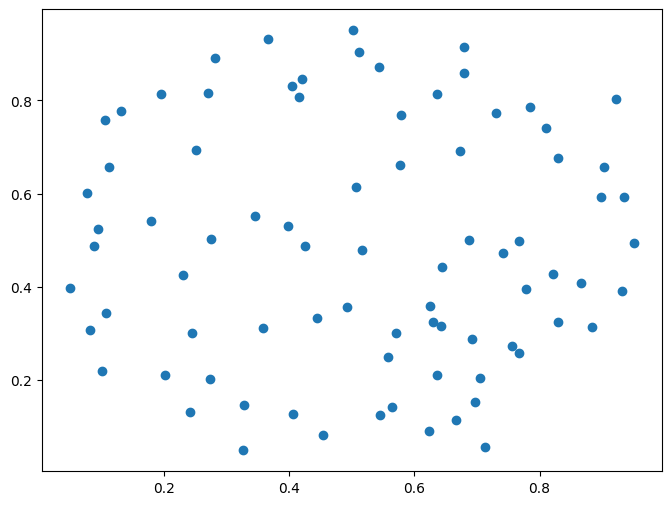

In [15]:
plt.figure(figsize=(8, 6))
plt.scatter(coords[:, 0], coords[:, 1])
plt.show()

# Convert to image

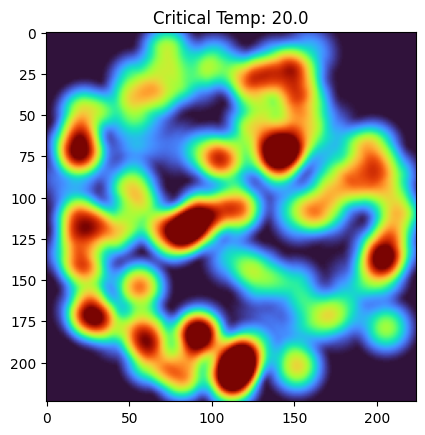

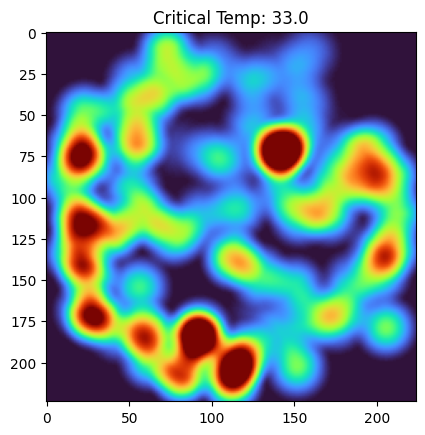

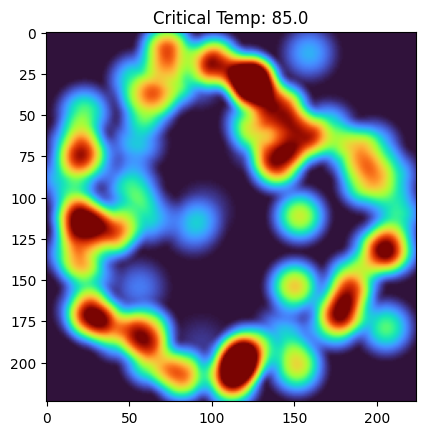

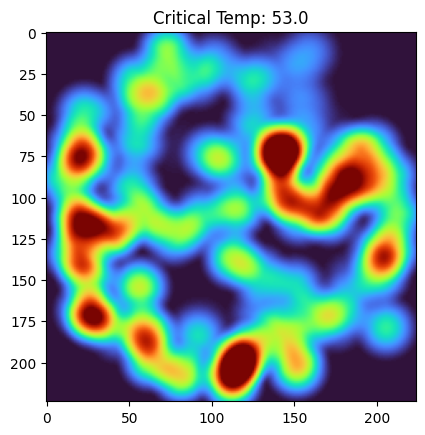

In [16]:
def fade_vec(d, radius):
    end = np.pi
    scaled = np.clip((d / radius) * end, 0, end)
    return (np.cos(scaled) + 1) / 2

def to_image(row, coords):
    grid = np.linspace(0, 1, 224)
    xn, yn = np.meshgrid(grid, grid)

    # Extract data
    row_values = row.values
    cx = coords[:, 0]
    cy = coords[:, 1]

    # Compute distances
    dx = xn[None, :, :] - cx[:, None, None]
    dy = yn[None, :, :] - cy[:, None, None]
    distances = np.sqrt(dx**2 + dy**2)

    intensities = np.sum(fade_vec(distances, 0.1) * row_values[:, None, None], axis=0)
    intensities = np.clip(intensities, 0, 1)

    # Colormap
    cmap = plt.get_cmap('turbo')
    result = cmap(intensities)[:, :, :3]

    return result

def showcase(row_num):
    image = to_image(X_train.iloc[row_num], coords)
    
    plt.imshow(image)
    plt.title(f'Critical Temp: {y_train[row_num]}')
    plt.show()

showcase(27)
showcase(7)
showcase(500)
showcase(223)

# Prepare pre-trained CNN

In [17]:
# Use ResNet50 without its classification head. We will replace that with a regression layer.
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(), 
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.2), 
    layers.Dense(1, activation='linear') # Single float output
])

model.compile(
    optimizer='adam', 
    loss='mean_squared_error',
    metrics=['mean_absolute_error']
)

## Pack CNN inputs

In [18]:
N = len(X_train)
X_images = np.zeros((N, 224, 224, 3), dtype=np.float32)

X_train = X_train.reset_index(drop=True)


for i in range(N):
    X_images[i] = to_image(X_train.iloc[i], coords)
    
    if i % 100 == 0:
        print(f"Processed {i}/{N} images...")

Processed 0/17010 images...
Processed 100/17010 images...
Processed 200/17010 images...
Processed 300/17010 images...
Processed 400/17010 images...
Processed 500/17010 images...
Processed 600/17010 images...
Processed 700/17010 images...
Processed 800/17010 images...
Processed 900/17010 images...
Processed 1000/17010 images...
Processed 1100/17010 images...
Processed 1200/17010 images...
Processed 1300/17010 images...
Processed 1400/17010 images...
Processed 1500/17010 images...
Processed 1600/17010 images...
Processed 1700/17010 images...
Processed 1800/17010 images...
Processed 1900/17010 images...
Processed 2000/17010 images...
Processed 2100/17010 images...
Processed 2200/17010 images...
Processed 2300/17010 images...
Processed 2400/17010 images...
Processed 2500/17010 images...
Processed 2600/17010 images...
Processed 2700/17010 images...
Processed 2800/17010 images...
Processed 2900/17010 images...
Processed 3000/17010 images...
Processed 3100/17010 images...
Processed 3200/17010

In [19]:
N = len(X_test)
X_test_images = np.zeros((N, 224, 224, 3), dtype=np.float32)

X_test = X_test.reset_index(drop=True)


for i in range(N):
    X_test_images[i] = to_image(X_test.iloc[i], coords)
    
    if i % 100 == 0:
        print(f"Processed {i}/{N} test images...")

Processed 0/4253 test images...
Processed 100/4253 test images...
Processed 200/4253 test images...
Processed 300/4253 test images...
Processed 400/4253 test images...
Processed 500/4253 test images...
Processed 600/4253 test images...
Processed 700/4253 test images...
Processed 800/4253 test images...
Processed 900/4253 test images...
Processed 1000/4253 test images...
Processed 1100/4253 test images...
Processed 1200/4253 test images...
Processed 1300/4253 test images...
Processed 1400/4253 test images...
Processed 1500/4253 test images...
Processed 1600/4253 test images...
Processed 1700/4253 test images...
Processed 1800/4253 test images...
Processed 1900/4253 test images...
Processed 2000/4253 test images...
Processed 2100/4253 test images...
Processed 2200/4253 test images...
Processed 2300/4253 test images...
Processed 2400/4253 test images...
Processed 2500/4253 test images...
Processed 2600/4253 test images...
Processed 2700/4253 test images...
Processed 2800/4253 test images.

# Train gallery

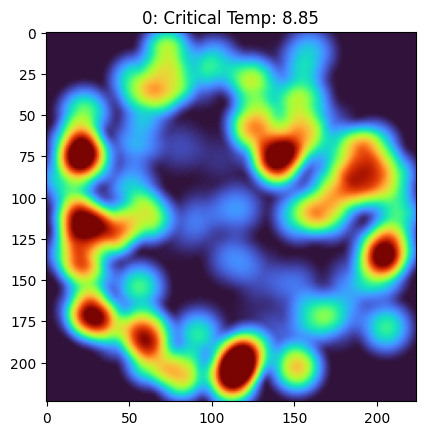

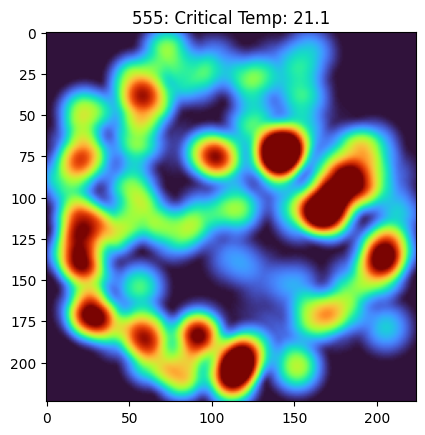

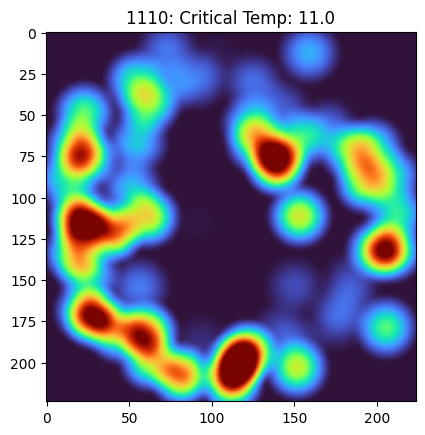

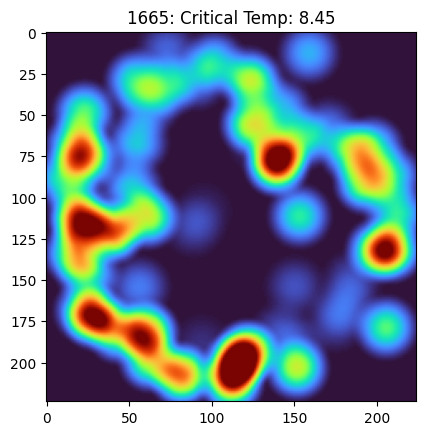

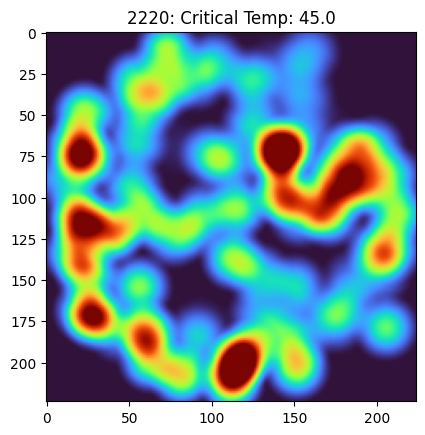

...

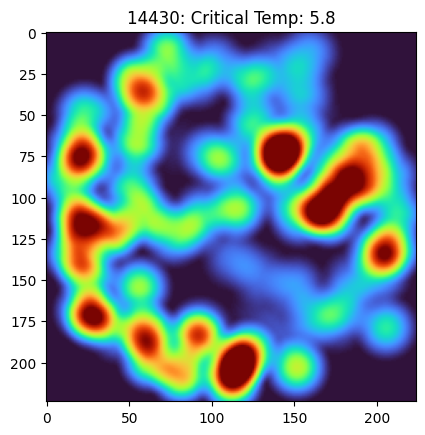

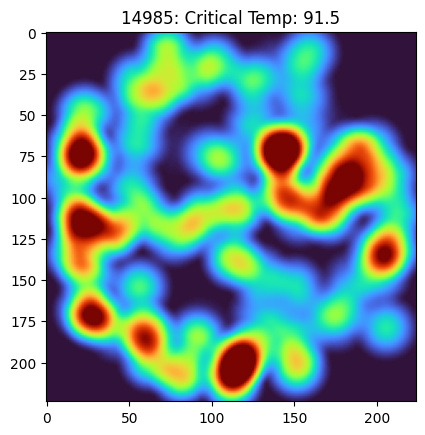

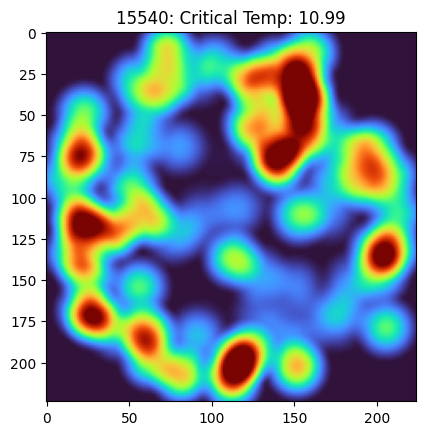

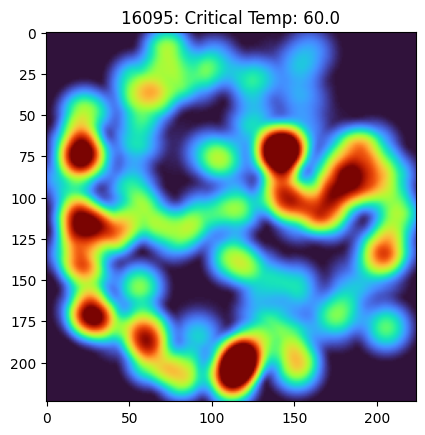

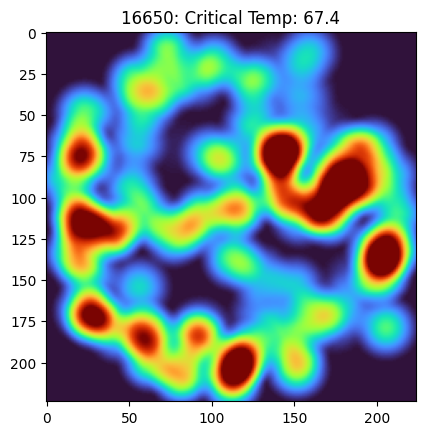

In [20]:
y_train = y_train.reset_index(drop=True)

for i in range(len(X_images)):
    if i % 555 != 0:
        continue
    plt.imshow(X_images[i])
    plt.title(f'{i}: Critical Temp: {y_train[i]}')
    plt.show()



# Test gallery

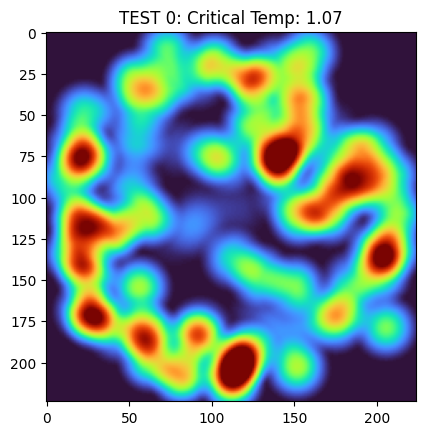

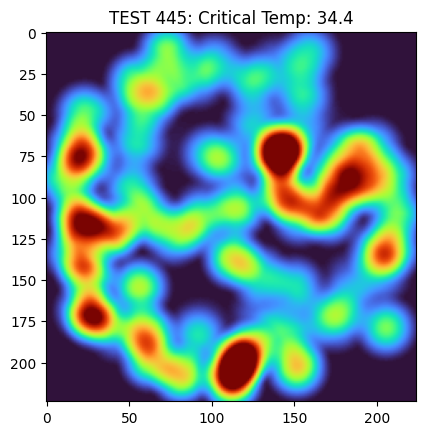

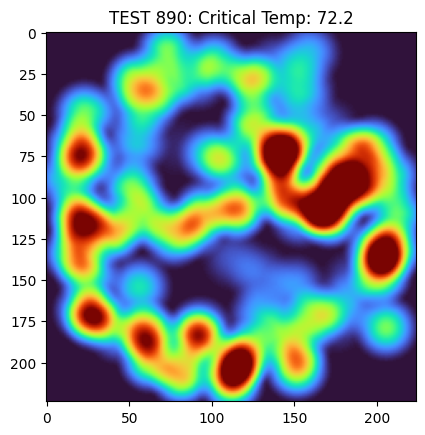

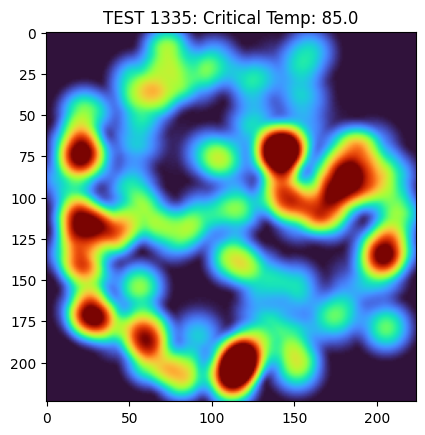

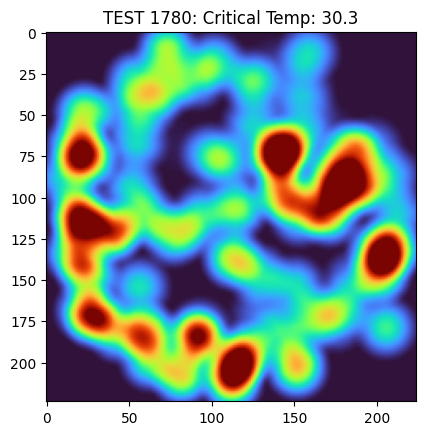

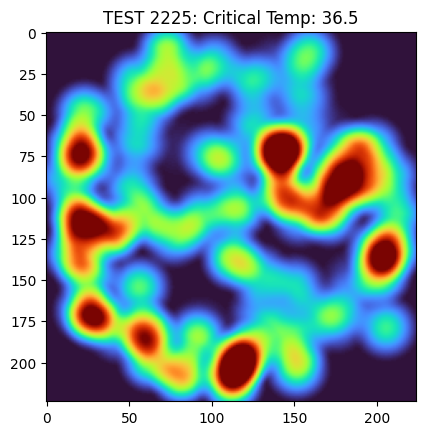

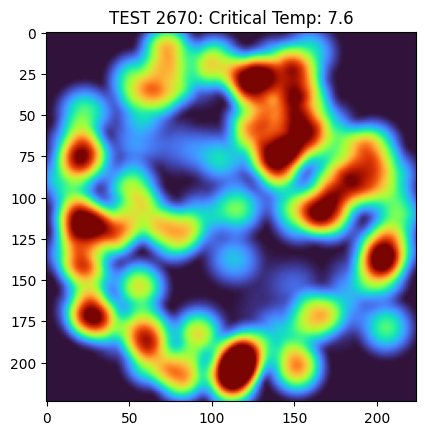

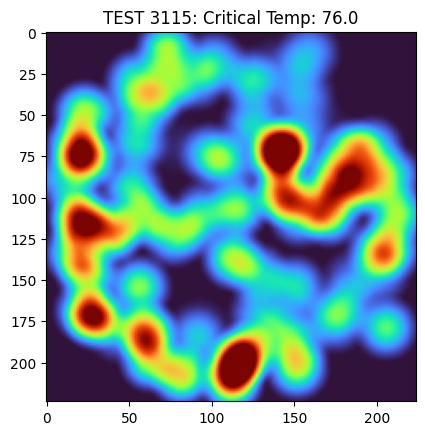

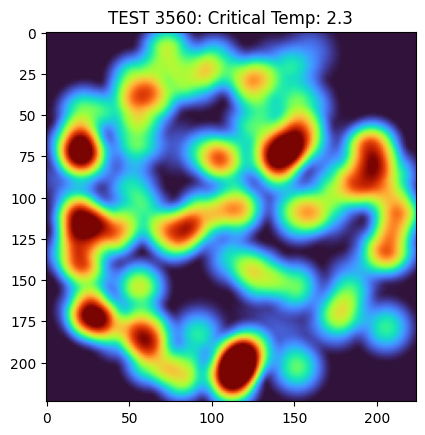

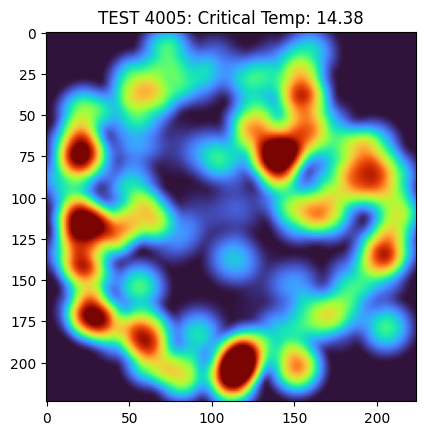

In [21]:
y_test = y_test.reset_index(drop=True)

for i in range(len(X_test_images)):
    if i % 445 != 0:
        continue
    plt.imshow(X_test_images[i])
    plt.title(f'TEST {i}: Critical Temp: {y_test[i]}')
    plt.show()



## Train CNN

In [22]:
# 1. Start Training
history = model.fit(
    X_images,   # Your (N, 224, 224, 3) numpy array
    y_train,   # Your (N,) numpy array of float targets
    epochs=20,
    batch_size=32,
    validation_split=0.2, # Uses 20% of data for live testing
    verbose=1             # Ensures the interactive progress bar shows
)

Epoch 1/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1707s 4s/step - loss: 351.5059 - mean_absolute_error: 12.9686 - val_loss: 2109.6768 - val_mean_absolute_error: 31.2599
Epoch 2/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1661s 4s/step - loss: 276.6107 - mean_absolute_error: 11.2347 - val_loss: 275.5687 - val_mean_absolute_error: 10.6414
Epoch 3/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1661s 4s/step - loss: 242.3836 - mean_absolute_error: 10.4337 - val_loss: 323.6709 - val_mean_absolute_error: 11.5021
Epoch 4/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1662s 4s/step - loss: 212.8947 - mean_absolute_error: 9.7285 - val_loss: 570.7591 - val_mean_absolute_error: 16.3462
Epoch 5/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1662s 4s/step - loss: 200.0339 - mean_absolute_error: 9.3745 - val_loss: 403.4214 - val_mean_absolute_error: 13.5742
Epoch 6/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1664s 4s/step - loss: 190.4634 - mean_absolute_error: 9.1168 - val_loss: 186.3427 - val_mean_absolute_error: 9.2413
Epoch 7/20
426/426 ━━━━━━━━━━━━━━━━━━━━ 1667s 4s/step -

## Fitness curve

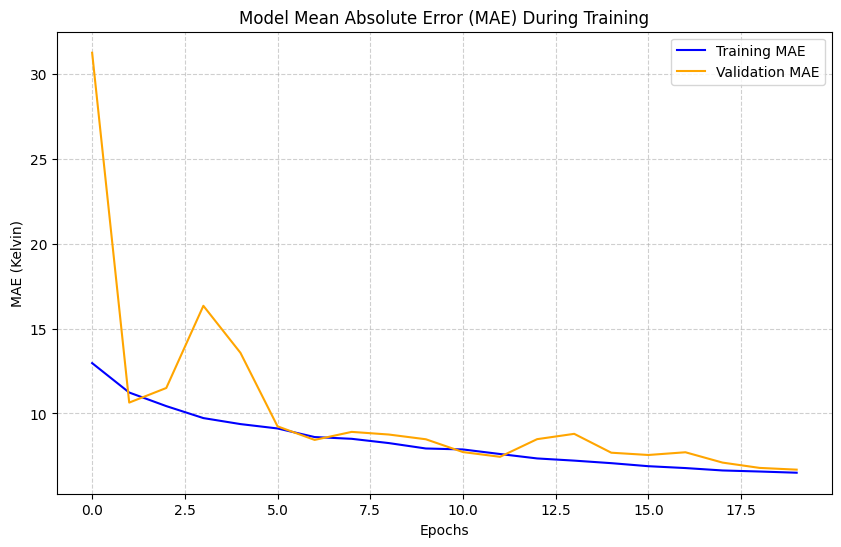

In [23]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['mean_absolute_error'], label='Training MAE', color='blue')
plt.plot(history.history['val_mean_absolute_error'], label='Validation MAE', color='orange')

# Formatting
plt.title('Model Mean Absolute Error (MAE) During Training')
plt.xlabel('Epochs')
plt.ylabel('MAE (Kelvin)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()

## Load / save model

In [24]:
#model.save('superconductor_resnet.keras')
model.save('superconductor_resnet_v2.keras')
#model = load_model('superconductor_resnet.keras')

# Test

In [25]:
# Generate predictions
y_pred = model.predict(X_test_images)
y_pred = y_pred.flatten()
y_pred

133/133 ━━━━━━━━━━━━━━━━━━━━ 107s 794ms/step


array([  1.8662935, 132.56688  ,  72.51338  , ...,   1.210927 ,
        76.46245  ,  12.827722 ], dtype=float32)

In [26]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"Test MAE: {mae:.2f} K")
print(f"Test RMSE: {rmse:.2f} K")

Test MAE: 6.85 K
Test RMSE: 11.17 K
